# Nerve Segmentation — Experiment Comparison

Compares **6 experiments** (3 normalisations × 2 losses) by visualising
reconstructed full-image predictions side-by-side.

Normalization is applied to the **full slide image before tiling** (`retile_all.py --norm …`).
All nnUNet plans use `NoNormalization` so tiles are **never re-normalized per-patch**
during `nnUNetv2_preprocess` or training.

| Experiment | Loss | Norm (applied to full image before tiling) | nnUNet plan |
|---|---|---|---|
| `CE_Histo`  | DC + CE         | Histology — clip [1%, 99%], rescale → [0,1] | `nnUNetPlansHistoNorm` |
| `CE_Nyul`   | DC + CE         | Nyul landmark standardisation → [0,1]       | `nnUNetPlansNyulNorm`  |
| `CE_NoNorm` | DC + CE         | None (raw uint8)                             | `nnUNetPlansNoNorm`    |
| `TV_Histo`  | Tversky α=0.3 β=0.7 | Histology                               | `nnUNetPlansHistoNorm` |
| `TV_Nyul`   | Tversky         | Nyul                                         | `nnUNetPlansNyulNorm`  |
| `TV_NoNorm` | Tversky         | None                                         | `nnUNetPlansNoNorm`    |

**Class colour map**

| Class | Name | Colour |
|---|---|---|
| 0 | Background | Black |
| 1 | ConnectivePerineurium | Orange |
| 2 | Adipose | Cyan |
| 3 | NerveFascicle | Magenta |
| 4 | Blood_vessel | Red |

---

### How the pipeline works

```
retile_all.py --norm histology   →  imagesTr/ tiles are float32 [0,1]
nnUNetv2_preprocess  -plans_name nnUNetPlansHistoNorm   # NoNorm inside → no re-normalization
nnUNetv2_train  -p nnUNetPlansHistoNorm                 # reads already-normalized tiles
```

Each normalization group gets its own preprocessed-data folder in `nnUNet_preprocessed/`:
- `nnUNetPlansHistoNorm_2d/`  ← histology-normalized tiles
- `nnUNetPlansNyulNorm_2d/`   ← Nyul-normalized tiles
- `nnUNetPlans_2d/`           ← raw (no normalization) tiles

> Run `bash run_experiments.sh` to tile, preprocess, and train all experiments.


In [30]:
import os, glob, json, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image

# ── Config ────────────────────────────────────────────────────────────────
WORKSPACE    = '/home/moyasans/Documents/nnUNet'
RAW_ROOT     = os.path.join(WORKSPACE, 'nnUNet_raw', 'Dataset001_NerveMAVI')
RESULTS_ROOT = os.path.join(WORKSPACE, 'nnUNet_results', 'Dataset001_NerveMAVI')
FOLD         = 0

# All plans use NoNormalization internally.
# Normalization is applied to FULL IMAGES in retile_all.py before tiling,
# so nnUNet never re-normalizes individual tiles.
EXPERIMENTS = [
    ('CE_Histo',   'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansHistoNorm'),
    ('CE_Nyul',    'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansNyulNorm'),
    ('CE_NoNorm',  'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansNoNorm'),
    ('TV_Histo',   'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansHistoNorm'),
    ('TV_Nyul',    'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansNyulNorm'),
    ('TV_NoNorm',  'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansNoNorm'),
]

# ── Normalization consistency check ───────────────────────────────────────
# Warn if any plan still has a non-NoNormalization scheme baked in
# (would mean nnUNet is re-normalizing already-normalized tiles).
_NONORM_PLANS = {'nnUNetPlansNoNorm', 'nnUNetPlansHistoNorm', 'nnUNetPlansNyulNorm'}
_bad = [(label, plan) for label, _, plan in EXPERIMENTS if plan not in _NONORM_PLANS]
if _bad:
    warnings.warn(
        f"\n[Normalization] The following experiments use plans that may apply "
        f"per-tile normalization during nnUNetv2_preprocess:\n"
        f"  {_bad}\n"
        f"All plans should use NoNormalization internally since normalization "
        f"is already applied to the full image before tiling.\n"
        f"Switch to nnUNetPlansHistoNorm / nnUNetPlansNyulNorm / nnUNetPlansNoNorm.",
        UserWarning, stacklevel=2,
    )

# Class colour map {class: (name, (R,G,B))}
CLASS_INFO = {
    0: ('Background',            (  0,   0,   0)),
    1: ('ConnectivePerineurium', (255, 165,   0)),
    2: ('Adipose',               (  0, 200, 255)),
    3: ('NerveFascicle',         (220,  50, 220)),  # magenta
    4: ('Blood_vessel',          (255,  50,  50)),
}
LEGEND = [
    mpatches.Patch(color=np.array(rgb)/255, label=f'{k}: {name}')
    for k, (name, rgb) in CLASS_INFO.items()
]

def label_to_rgba(pred: np.ndarray, alpha: float = 0.6) -> np.ndarray:
    rgba = np.zeros((*pred.shape, 4), dtype=np.uint8)
    for cls, (_, rgb) in CLASS_INFO.items():
        mask = pred == cls
        rgba[mask, :3] = rgb
        rgba[mask,  3] = int(alpha * 255)
    return rgba

# ── Auto-discover reconstructed results ───────────────────────────────────
results = {}
for label, trainer, plan in EXPERIMENTS:
    recon_dir = os.path.join(RESULTS_ROOT,
                             f'{trainer}__{plan}__2d',
                             f'fold_{FOLD}', 'reconstructed')
    if not os.path.isdir(recon_dir):
        print(f'[MISSING] {label}')
        continue
    pred_files = sorted(glob.glob(os.path.join(recon_dir, '*_pred.tif')))
    if not pred_files:
        print(f'[EMPTY]   {label}')
        continue
    preds = {os.path.basename(p).replace('_pred.tif', ''): p for p in pred_files}
    results[label] = {'dir': recon_dir, 'preds': preds}
    print(f'[OK]  {label:12s}  {len(preds)} images')

STEMS = sorted(set.intersection(*[set(v['preds']) for v in results.values()])) if results else []
print(f'\n{len(results)}/{len(EXPERIMENTS)} experiments ready,  {len(STEMS)} shared source images')

# ── Verify test/train split ───────────────────────────────────────────────
_tile_index  = json.load(open(os.path.join(RAW_ROOT, 'tile_index.json')))
_labels_ts   = os.path.join(RAW_ROOT, 'labelsTs')

print('\nSplit membership of test images:')
for stem in STEMS:
    matching = [v for v in _tile_index.values() if stem in v['source_file']]
    splits   = set(v['split'] for v in matching)
    print(f'  {stem[:55]:55s}  splits={splits}')

# ── Reconstruct ground-truth label maps from labelsTs tiles ───────────────
def get_gt(stem: str) -> np.ndarray | None:
    tiles = {k: v for k, v in _tile_index.items()
             if v['split'] == 'test' and stem in v['source_file']}
    if not tiles:
        return None
    first = next(iter(tiles.values()))
    H, W, ts = first['source_height'], first['source_width'], first['tile_size']
    canvas = np.zeros((H, W), dtype=np.uint8)
    for case_name, info in tiles.items():
        lbl_path = os.path.join(_labels_ts, f'{case_name}.tif')
        if not os.path.exists(lbl_path):
            continue
        tile = np.array(Image.open(lbl_path))
        y, x = info['y_offset'], info['x_offset']
        ah   = info.get('actual_h', ts)
        aw   = info.get('actual_w', ts)
        canvas[y:y+ah, x:x+aw] = tile[:ah, :aw]
    return canvas

GTS = {stem: get_gt(stem) for stem in STEMS}
gt_ok = sum(1 for v in GTS.values() if v is not None)
print(f'\nGround-truth maps reconstructed: {gt_ok}/{len(STEMS)}')


[OK]  CE_Histo      4 images
[OK]  CE_Nyul       4 images
[OK]  CE_NoNorm     4 images
[OK]  TV_Histo      4 images
[OK]  TV_Nyul       4 images
[OK]  TV_NoNorm     4 images

6/6 experiments ready,  4 shared source images

Split membership of test images:
  Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_40x_resa  splits={'test'}
  Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_10x_resa  splits={'test'}
  GTEX-1212Z-2725_2                                        splits={'test'}
  GTEX-SSA3-0525_2                                         splits={'test'}

Ground-truth maps reconstructed: 4/4


In [31]:
def compare_image(stem: str, alpha: float = 0.55, col_width: int = 4):
    """
    Two-row figure for one source image.
    Columns: Original | GT (if available) | CE_Histo | ... | TV_NoNorm
    Row 0: coloured overlay on original
    Row 1: greyscale label map
    """
    if not results:
        print('No results loaded.'); return

    # Load original
    orig_arr = None
    for lbl in results:
        p = os.path.join(results[lbl]['dir'], f'{stem}_orig.tif')
        if os.path.exists(p):
            orig_arr = np.array(Image.open(p).convert('L'))
            break
    if orig_arr is None:
        print(f'Original not found for {stem}'); return

    gt = GTS.get(stem)
    exp_labels = list(results.keys())

    # build column list: Original, [GT], experiments...
    col_titles = ['Original'] + (['GT'] if gt is not None else []) + exp_labels
    n_cols = len(col_titles)
    n_cls  = max(CLASS_INFO.keys())

    fig, ax = plt.subplots(2, n_cols,
                           figsize=(col_width * n_cols, col_width * 2),
                           gridspec_kw={'hspace': 0.04, 'wspace': 0.02})

    def _render(col, label_map, title, bold=False):
        """Fill one column with overlay (row 0) and greyscale map (row 1)."""
        ax[0, col].imshow(orig_arr, cmap='gray')
        ax[0, col].imshow(label_to_rgba(label_map, alpha))
        ax[0, col].axis('off')
        weight = 'bold' if bold else 'normal'
        ax[0, col].set_title(title, fontsize=9, fontweight=weight, pad=3,
                             color='darkgreen' if bold else 'black')
        ax[1, col].imshow(label_map, cmap='gray', vmin=0, vmax=n_cls)
        ax[1, col].axis('off')

    # col 0: original (no overlay)
    for row in range(2):
        ax[row, 0].imshow(orig_arr, cmap='gray')
        ax[row, 0].axis('off')
    ax[0, 0].set_title('Original', fontsize=9, fontweight='bold', pad=3)

    col_offset = 1
    if gt is not None:
        _render(1, gt, 'GT ✓', bold=True)
        col_offset = 2

    for i, label in enumerate(exp_labels):
        c = i + col_offset
        pred_path = results[label]['preds'].get(stem)
        if pred_path is None:
            ax[0, c].axis('off'); ax[1, c].axis('off'); continue
        pred = np.array(Image.open(pred_path))
        _render(c, pred, label)

    fig.suptitle(stem, fontsize=11, fontweight='bold', y=1.01)
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    plt.show()


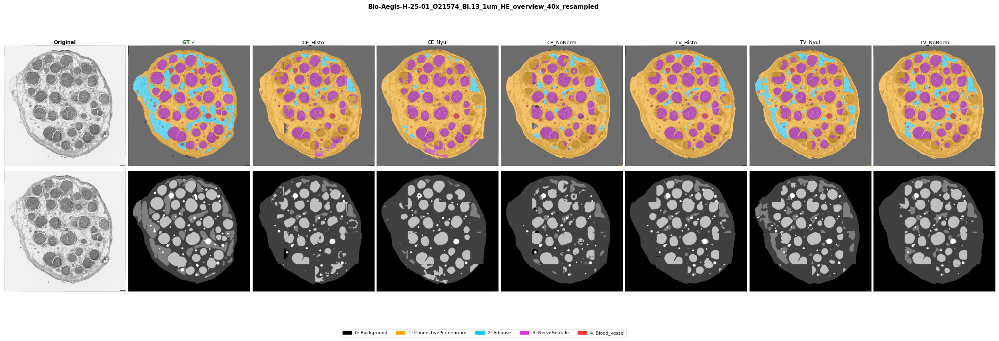

In [32]:
# ── Show one specific image  (edit stem to inspect a different one) ────────
if STEMS:
    compare_image(STEMS[0])


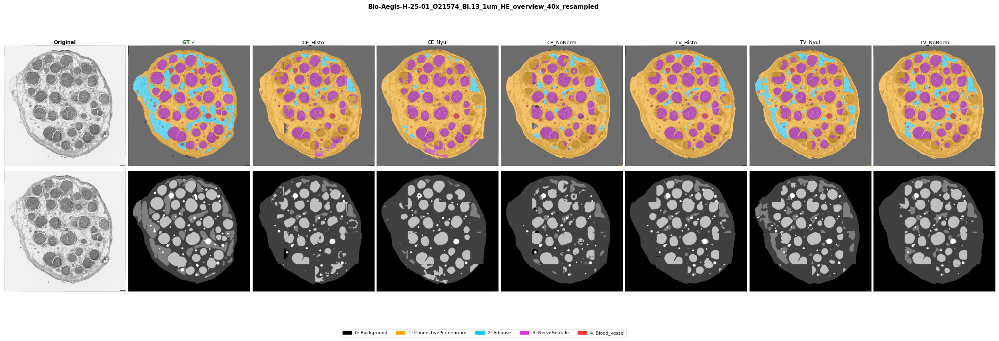

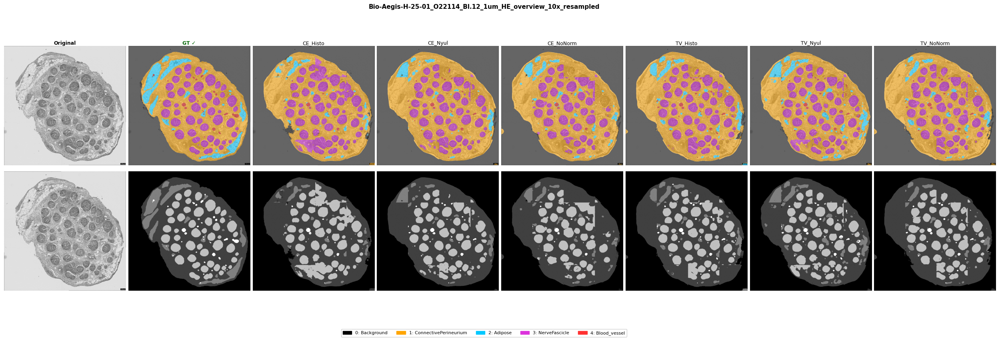

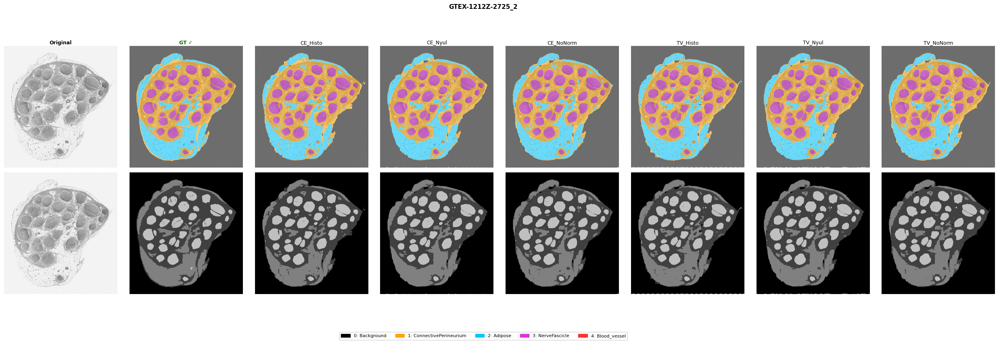

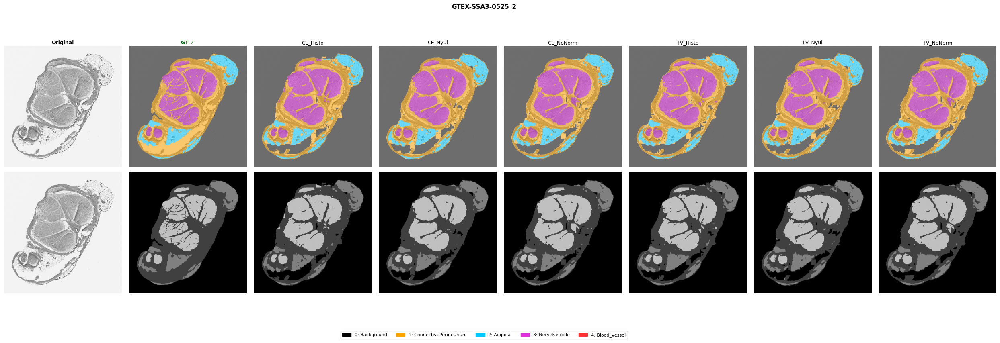

In [33]:
# ── Full gallery: one figure per test image ────────────────────────────────
for stem in STEMS:
    compare_image(stem)


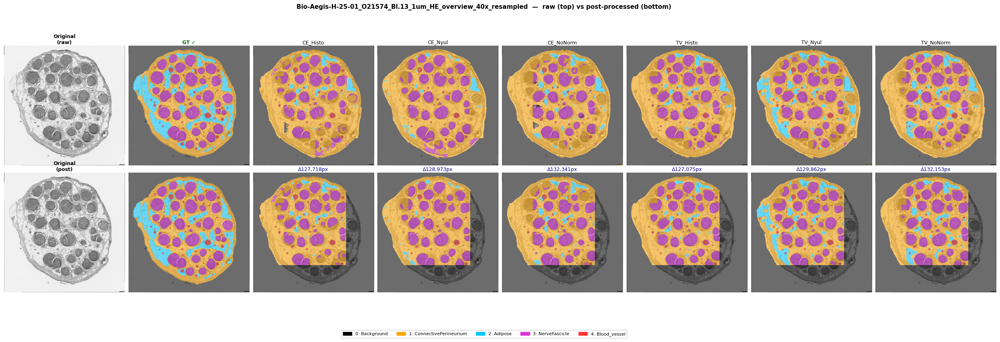

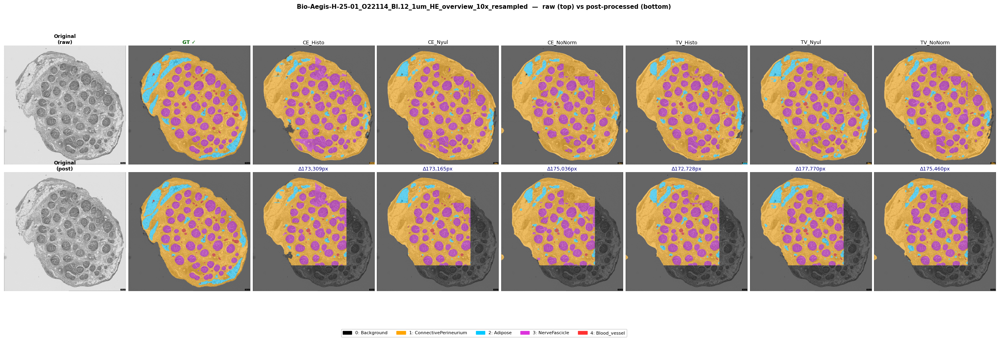

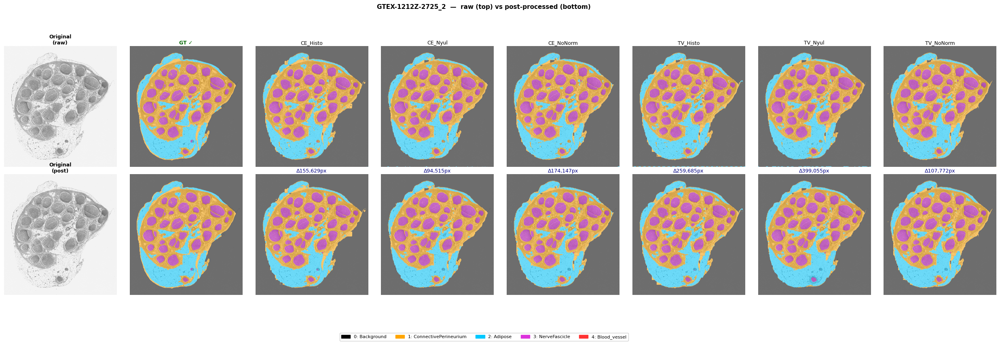

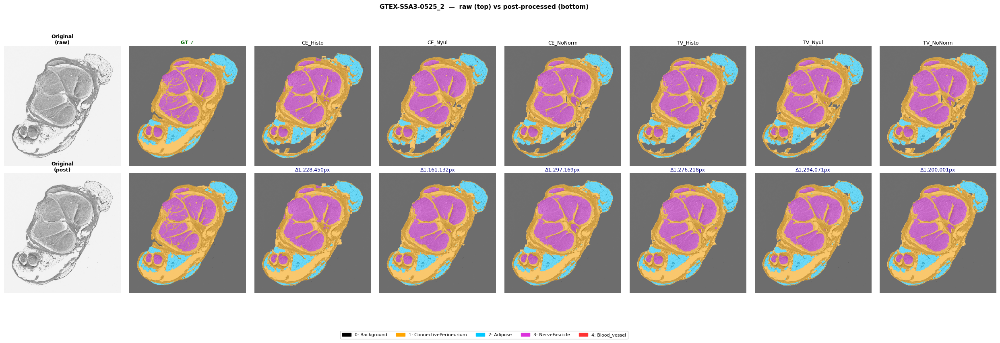

In [34]:
def compare_postpro(stem: str, alpha: float = 0.55, col_width: int = 4):
    """
    Columns: Original | GT ✓ | CE_Histo | CE_Nyul | CE_NoNorm | TV_Histo | TV_Nyul | TV_NoNorm
    Row 0: raw prediction overlay on original
    Row 1: post-processed overlay on original (title shows Δ changed pixels)
    """
    if not results:
        print('No results loaded.'); return

    orig_arr = None
    for lbl in results:
        p = os.path.join(results[lbl]['dir'], f'{stem}_orig.tif')
        if os.path.exists(p):
            orig_arr = np.array(Image.open(p).convert('L'))
            break
    if orig_arr is None:
        print(f'Original not found for {stem}'); return

    gt         = GTS.get(stem)
    exp_labels = list(results.keys())
    gt_cols    = 1 if gt is not None else 0
    n_cols     = 1 + gt_cols + len(exp_labels)

    fig, ax = plt.subplots(2, n_cols,
                           figsize=(col_width * n_cols, col_width * 2),
                           gridspec_kw={'hspace': 0.06, 'wspace': 0.02})

    def _overlay(row, col, label_map, title, bold=False, color='black'):
        ax[row, col].imshow(orig_arr, cmap='gray')
        ax[row, col].imshow(label_to_rgba(label_map, alpha))
        ax[row, col].axis('off')
        if title:
            ax[row, col].set_title(title, fontsize=9,
                                   fontweight='bold' if bold else 'normal',
                                   color=color, pad=3)

    # Col 0: original (both rows)
    for row in range(2):
        ax[row, 0].imshow(orig_arr, cmap='gray')
        ax[row, 0].axis('off')
    ax[0, 0].set_title('Original\n(raw)', fontsize=9, fontweight='bold', pad=3)
    ax[1, 0].set_title('Original\n(post)', fontsize=9, fontweight='bold', pad=3)

    col = 1
    if gt is not None:
        _overlay(0, col, gt, 'GT ✓', bold=True, color='darkgreen')
        _overlay(1, col, gt, '',     bold=True, color='darkgreen')
        col += 1

    for label in exp_labels:
        pred_path    = results[label]['preds'].get(stem)
        postpro_path = pred_path.replace('_pred.tif', '_pred_postpro.tif') if pred_path else None

        raw  = np.array(Image.open(pred_path))    if pred_path    and os.path.exists(pred_path)    else None
        post = np.array(Image.open(postpro_path)) if postpro_path and os.path.exists(postpro_path) else None

        # Row 0: raw
        if raw is not None:
            _overlay(0, col, raw, label)
        else:
            ax[0, col].axis('off')

        # Row 1: post-processed
        if post is not None:
            delta = f'Δ{int((raw != post).sum()):,}px' if raw is not None else 'post'
            _overlay(1, col, post, delta, color='navy')
        elif raw is not None:
            _overlay(1, col, raw, '(no post)')
        else:
            ax[1, col].axis('off')

        col += 1

    fig.suptitle(f'{stem}  —  raw (top) vs post-processed (bottom)',
                 fontsize=11, fontweight='bold', y=1.01)
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    plt.show()


# ── Post-processed gallery ────────────────────────────────────────────────────
for stem in STEMS:
    compare_postpro(stem)


In [29]:
import pandas as pd

def class_distribution(stem: str) -> pd.DataFrame:
    """Per-class pixel % for GT and every experiment on the given source image."""
    rows = []
    def _row(name, arr):
        total = arr.size
        r = {'Experiment': name}
        for cls, (cname, _) in CLASS_INFO.items():
            r[f'cls{cls}_{cname[:6]}%'] = round(100 * (arr == cls).sum() / total, 2)
        return r

    # Ground truth first
    gt = GTS.get(stem)
    if gt is not None:
        rows.append(_row('GT ✓', gt))

    for label in results:
        pred_path = results[label]['preds'].get(stem)
        if pred_path is None:
            continue
        rows.append(_row(label, np.array(Image.open(pred_path))))

    return pd.DataFrame(rows).set_index('Experiment')

# ── Summary table for all test images ─────────────────────────────────────
for stem in STEMS:
    print(f'\nClass distribution (%) — {stem}')
    display(class_distribution(stem).round(2))



Class distribution (%) — Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_40x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,55.25,19.93,9.87,13.74,1.21
CE_Histo,55.17,31.47,1.58,11.01,0.77
CE_Nyul,54.58,31.24,0.70,12.86,0.62
CE_NoNorm,54.93,31.29,1.95,11.19,0.64
TV_Histo,54.57,29.51,1.58,13.44,0.90
TV_Nyul,54.76,27.26,4.99,12.11,0.88
TV_NoNorm,54.54,28.44,3.08,13.16,0.77



Class distribution (%) — Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_10x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,60.22,24.05,4.94,10.31,0.49
CE_Histo,59.75,27.04,1.50,11.48,0.22
CE_Nyul,59.04,28.97,1.69,10.00,0.30
CE_NoNorm,58.75,28.04,2.06,10.92,0.22
TV_Histo,58.62,28.31,2.26,10.42,0.38
TV_Nyul,59.16,27.10,3.11,10.24,0.39
TV_NoNorm,58.75,28.55,1.74,10.63,0.32



Class distribution (%) — GTEX-1212Z-2725_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,47.18,26.72,14.45,11.65,0.0
CE_Histo,47.30,26.15,13.93,12.61,0.0
CE_Nyul,47.55,25.13,14.75,12.57,0.0
CE_NoNorm,47.41,25.17,14.68,12.73,0.0
TV_Histo,47.29,25.22,14.91,12.57,0.0
TV_Nyul,47.65,24.97,14.88,12.51,0.0
TV_NoNorm,47.22,25.57,14.49,12.72,0.0



Class distribution (%) — GTEX-SSA3-0525_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,56.15,24.59,6.21,13.05,0.0
CE_Histo,58.49,20.72,6.14,14.65,0.0
CE_Nyul,58.72,20.78,6.34,14.17,0.0
CE_NoNorm,58.86,19.76,6.48,14.91,0.0
TV_Histo,58.67,20.43,6.56,14.34,0.0
TV_Nyul,59.06,20.53,6.52,13.89,0.0
TV_NoNorm,58.66,20.17,6.54,14.63,0.0
